In [1]:
import os
import random
import matplotlib
import matplotlib.pyplot as plt

In [3]:
def addition_mat(mat1, mat2):
    final_mat = []
    for i in range(len(mat1)):
        final_mat.append(mat1[i]+mat2[i])
    return final_mat

def subtraction_mat(mat1, mat2):
    final_mat = []
    for i in range(len(mat1)):
        final_mat.append(mat1[i]-mat2[i])
    return final_mat

def pi_sigma(mat1, mat2):
    pi_mat = []
    if len(mat1) == len(mat2):
        for i in range(len(mat1)):
            pi_mat.append(mat1[i]*mat2[i])
        sigma = sum(pi_mat)
        return (pi_mat, sigma)
    else:
        print("Error")
        response = f"Length of Matrix: {mat1} and Matrix: {mat2} are not equal."
        return response

def init_weights(num, flag = 0):
    if flag == 0:
        weights = []
        for i in range(num):
            weights.append(0)
        return weights
    else:
        weights = []
        for i in range(num):
            weights.append(random.randint(0, 100))
        return weights

def rolling_mean(val_list):
    arithematic_mean = 0
    for i in range(len(val_list)):
        arithematic_mean = arithematic_mean + val_list[i]
    arithematic_mean = arithematic_mean//(len(val_list))
    return arithematic_mean

In [13]:
triangle_DIR = r"B:\Projects\Neural Networks\Dataset\Triangles\Inverted\Binary"
circle_DIR = r"B:\Projects\Neural Networks\Dataset\Circles\Inverted\Binary"
triangle_list = os.listdir(triangle_DIR)
circle_list = os.listdir(circle_DIR)
final_list = []
train_thresh = 0 # Should become 20 for 20 training images
activation_num = 0
weights = init_weights(7360, 1)

In [14]:
for i in range(len(triangle_list)):
    final_list.append(os.path.join(triangle_DIR, triangle_list[i]))

for i in range(len(circle_list)):
    final_list.append(os.path.join(circle_DIR, circle_list[i]))

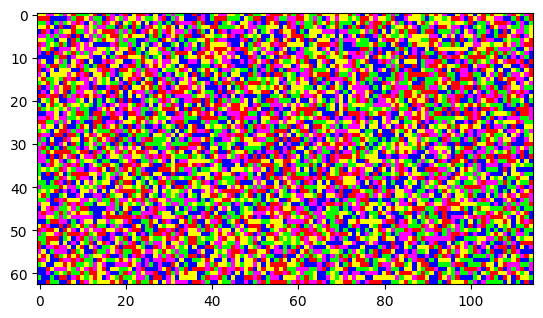

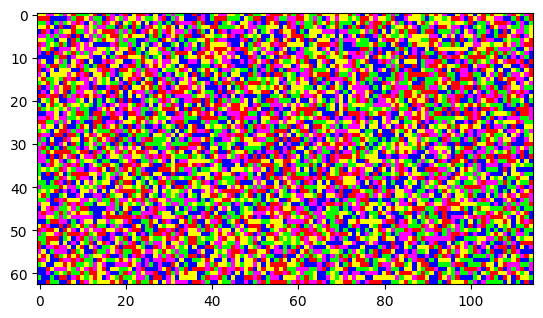

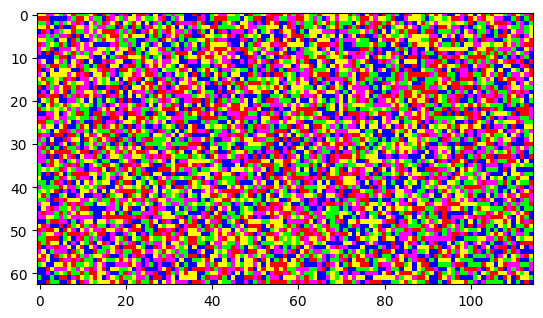

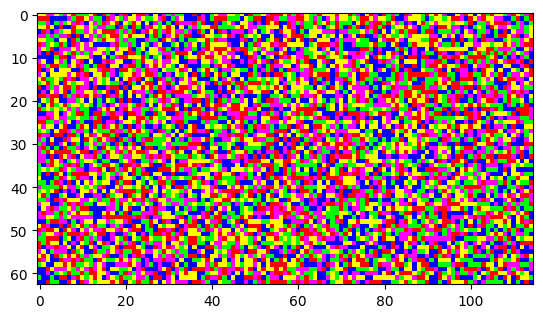

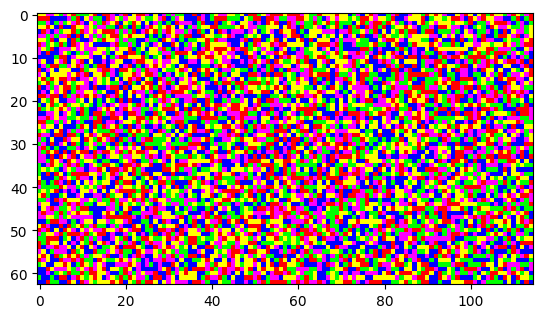

...

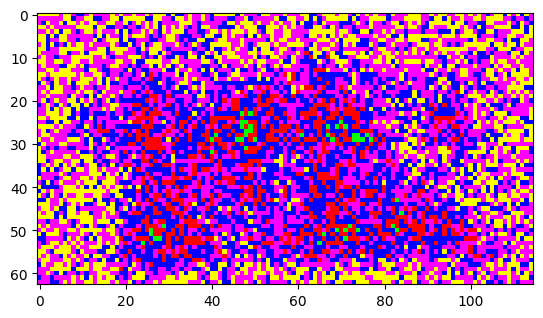

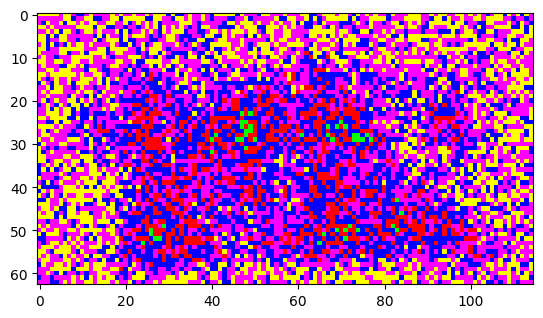

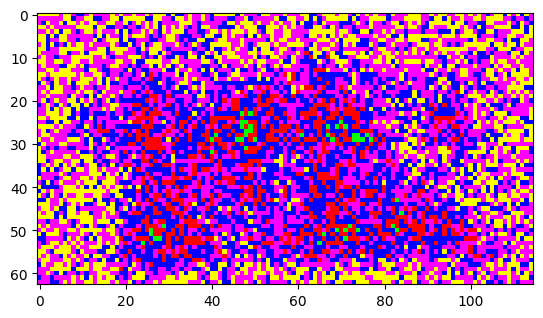

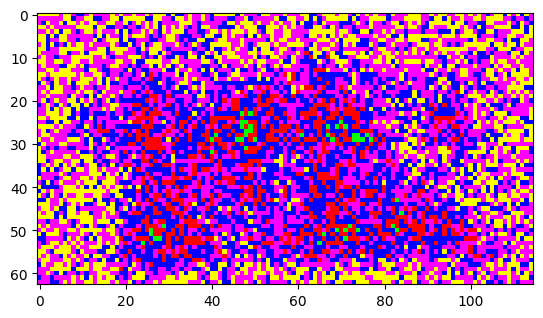

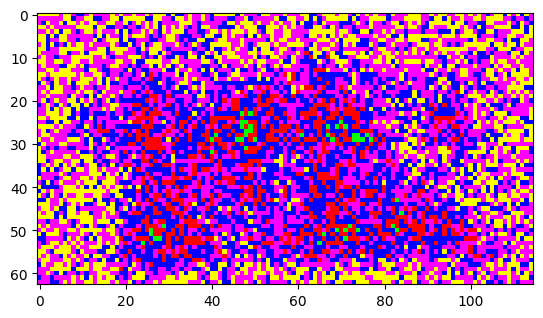

334


In [15]:
while train_thresh < 100:
    random_file = random.choice(final_list)
    file_flag = "Triangle" if "Triangles" in random_file else "Circle"
    file = open(random_file, "r")
    img_mat = list(map(int, file.read()))
    file.close()
    neuron_val = pi_sigma(img_mat, weights)[1]
    neuron_activate = 0
    if neuron_val >= activation_num:
        neuron_activate = 1
    else:
        neuron_activate = 0
    #print(neuron_val, activation_num, file_flag, neuron_activate)
    if file_flag == "Circle" and neuron_activate == 1:
        #print("First")
        train_thresh = train_thresh + 1
        activation_num = activation_num + 1
    elif file_flag == "Triangle" and neuron_activate == 1:
        #print("Second")
        weights = subtraction_mat(weights, img_mat)
        train_thresh = train_thresh - 1
        activation_num = activation_num + 1
    elif file_flag == "Circle" and neuron_activate == 0:
        #print("Third")
        weights = addition_mat(weights, img_mat)
        train_thresh = train_thresh - 1
        activation_num = activation_num - 1
    elif file_flag == "Triangle" and neuron_activate == 0:
        #print("Fourth")
        train_tresh = train_thresh + 1
        activation_num = activation_num - 1
    else:
        train_thresh = train_thresh + 1
        continue
    img_readable_mat = []
    row = []
    for i in range(len(weights)):
        if i % 115 == 0 and i != 0:
            img_readable_mat.append(row)
            row = []
            row.append(weights[i])
        elif i % 115 == 0 and i == 0:
            row.append(weights[i])
        else:
            row.append(weights[i])
    colors = 'lime red blue magenta yellow'.split()
    cmap = matplotlib.colors.ListedColormap(colors, name='colors', N=None) 
    plt.imshow(img_readable_mat, cmap=cmap)
    plt.show()
    #plt.imsave("Weights/weights.png", img_readable_mat, cmap=cmap)
print(activation_num)

In [44]:
img = []
row = []
print(len(weights))
"""for i in range(len(weights)):
    if i % 115 == 0 and i != 0:
        img.append(row)
        row = []
        row.append(weights[i])
    elif i % 115 == 0 and i == 0:
        row.append(weights[i])
    else:
        row.append(weights[i])

for row in weights:
    print(row)"""

file = open("Weights/weights.txt", "w")
for i in range(len(weights)):
    if i == len(weights)-1:
        file.write(str(weights[i]))
        continue
    file.write(f"{str(weights[i])},")
file.close()

7360
